In [112]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling
import datetime
from dateutil.relativedelta import relativedelta
from tqdm import tqdm_notebook
import itertools

import os
import os.path as osp
import gc
%matplotlib inline
TEST_START_DATE = pd.to_datetime('2018-02-01')

In [2]:
from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as py
import cufflinks as cf
cf.go_offline()
init_notebook_mode(connected=True)
pd.set_option('display.max_columns', 500)

In [3]:
flat_df = pd.read_csv('flat.csv', encoding='cp1251')
price_df = pd.read_csv('price.csv', encoding='cp1251')
status_df = pd.read_csv('status.csv', encoding='cp1251')
train_df = pd.read_csv('train.csv',  encoding='cp1251')
test_df = pd.read_csv('test.csv')

Множество за период по проекту   - множество квартир находившихся хотя бы в одном из статусов: В реализации, Зарезервирован под клиента, Платное бронирование, Онлайн бронирование в отчетный период, плюс  квартиры проданных в  отчетном периоде

Множество за период по корпусу/комнатности (далее Сет)- подможество из Множества за период по проекту  состоящее из квартир с одинаковой комнатностью(spalen) и из одного корпуса (bulk). Предсказание делается для каждого такого множества.

__id_bulk__	id корпуса (id_bulk)

__spalen__	комнатность квартиры

__date1__	первое числов месяца отчетного периода за который рассчитывается проданные площади

__start_square__	суммарная площадь квартир из Сета

__value__	суммарная площадь проданных квартир из Сета за отчетный период

__price__	средняя цена на квартир из Сета на начало периода

__mean_sq__	средняя площадь квартир из Сета

__mean_fl__	средний этаж квартир из Сета

__plan_s__	кол-во квартир с S планировкой из Сета

__plan_m__	кол-во квартир с M планировкой из Сета

__plan_l__	кол-во квартир с L планировкой из Сета

__vid_0__	кол-во квартир с эконом видом из Сета

__vid_1__	кол-во квартир с средним видом из Сета

__vid_2__	кол-во квартир с хорошим видом из Сета

__month__	номер месяца (календарный)

__month_cnt__	номер месяца начиная с 01.01.2015 по начало отчетного периода

__Класс объекта__	класс проекта

__Количество помещений__	количество помещений по проекту

__Огорожена территория__	да/нет

__Площадь земельного участка__	площадь земельного участка проекта, га

__Входные группы__	входные группы на уровне земли (да/нет)

__Детский сад__	количество мест

__Школа__	количество мест

__Поликлиника__	количество мест

__ФОК__	площадь физкультурно-оздоровительного комплекса

__Спортивная площадка__	да/нет

__Автомойка__	да/нет

__Кладовые__	да/нет

__Колясочные__	да/нет

__Кондиционирование__	уровень системы кондиционирования

__Вентлияция__	уровень системы вентиляции

__Лифт__	уровень лифтов

__Система мусоротведения__	тип системы

__Видеонаблюдение__	уровень системы видеонаблюдения

__Подземная парковка__	да/нет

__Двор без машин__	да/нет

__Машиномест__	количество машиномест

__Площадь пром. зоны__ в радиусе 500 м	площадь пром. зоны в радиусе 500 м

__Площадь зеленой зоны__ в радиусе 500 м	площадь зеленой зоны в радиусе 500 м

__До Кремля__	от корпуса до Кремля (км)

__До ТТК(км)__	от корпуса до ТТК(км)

__До Садового(км)__	от корпуса до Садового кольца (км)

__До большой дороги на машине(км)__	от корпусадо большой дороги на машине(км)

__До удобной авторазвязки на машине(км)__	от корпуса до удобной авторазвязки на машине(км)

__До метро пешком(км)__	от корпуса до метро пешком(км)

__До промки(км)__	от корпуса до промки(км)

__До парка(км)__	от корпуса до парка(км)

__До парка пешком(км)__	от корпуса до парка пешком(км)

__Станций метро от кольца__	станций метро от кольца

__Площадь двора__	площадь двора

__Курс__	средний курс доллара за отчетный период

__Cтавка по ипотеке__	средняя ставка по ипотеке за отчетный периода

__Вклады до 1 года__	средняя ставка по вкладам до 1 года за отчетный период

__Вклады от 1 года до 3 лет__	средняя ставка по вкладам от 1 года  до 3 лет за отчетный период

__Вклады свыше 3 лет__	средняя ставка по вкладам свыше 3 лет за отчетный период

In [34]:
pandas_profiling.ProfileReport(pd.concat([train_df, test_df], sort=False))

Number of variables,57
Number of observations,10486
Total Missing (%),2.4%
Total size in memory,4.6 MiB
Average record size in memory,456.0 B
Numeric,39
Categorical,10
Boolean,1
Date,0
Text (Unique),0
Rejected,7


In [35]:
pandas_profiling.ProfileReport(flat_df)

Number of variables,51
Number of observations,111586
Total Missing (%),0.8%
Total size in memory,43.4 MiB
Average record size in memory,408.0 B
Numeric,23
Categorical,18
Boolean,2
Date,0
Text (Unique),1
Rejected,7


In [36]:
pandas_profiling.ProfileReport(price_df)

Number of variables,5
Number of observations,647698
Total Missing (%),0.0%
Total size in memory,24.7 MiB
Average record size in memory,40.0 B
Numeric,1
Categorical,4
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [37]:
pandas_profiling.ProfileReport(status_df)

Number of variables,5
Number of observations,696799
Total Missing (%),0.0%
Total size in memory,26.6 MiB
Average record size in memory,40.0 B
Numeric,1
Categorical,4
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [38]:
pd.read_csv('sample submission.csv')

,id,value
0,0,1
1,1,1
2,2,1
3,3,1
4,4,1
5,5,1
6,6,1
7,7,1
8,8,1
9,9,1


In [48]:
# Train-test intersection over  bulk_id
len(set(train_df.bulk_id.values) & set(test_df.bulk_id.values)) / len(set(test_df.bulk_id.values))

0.8790697674418605

In [55]:
train_setid = train_df.bulk_id.astype(str)+'\\'+train_df.spalen.astype(str)
test_setid = test_df.bulk_id.astype(str)+'\\'+test_df.spalen.astype(str)

In [57]:
#Target groups intersection
len(set(train_setid.values) & set(test_setid.values)) / len(set(test_setid.values))

0.8497854077253219

In [72]:
submission = train_df.groupby(['bulk_id','spalen'])['value'].mean().reset_index()
submission['set_id'] = submission.bulk_id.astype(str)+'\\'+submission.spalen.astype(str)

In [74]:
test_df['set_id'] =test_df.bulk_id.astype(str)+'\\'+test_df.spalen.astype(str)

In [82]:
submission = test_df[['set_id','spalen']].merge(submission[['set_id','value']], on='set_id', how='left')

In [84]:
spalen_target_mean = train_df.groupby('spalen')['value'].mean().reset_index()

In [94]:
submission['value'] = submission['value'].fillna(
    submission['spalen'].to_frame().merge(spalen_target_mean, on='spalen', how='left')['value']
)


In [101]:
submission['value'].reset_index().rename(columns={'index':'id'}).\
to_csv('dummy_submission.csv', header=True, index=False)

## 307.90631 on LB

In [105]:
train_df['id'] = train_setid

In [111]:
train_df['date1'] = pd.to_datetime(train_df.date1)

In [128]:
train_df.groupby('date1')['id'].count().iplot(title='Семплов на дату')

In [135]:
date_grouped = train_df.groupby('date1')['id']

In [137]:
res = []
test_setid = set(test_setid.values)
for date, setid in  date_grouped:
    share = len(set(setid.values) & test_setid) / len(set(setid.values))
    res.append([date, share])

In [142]:
pd.DataFrame(res, columns=['date', 'share']).set_index('date').iplot(title='Часть общих сетов с тестом по дате')

In [ ]:
#TODO:
# Распределение делта-цена делта-спрос
# Динамика цен по сету (по дате, от начала продаж, )

In [158]:
train_df['flat_cnt'] = train_df[['plan_s','plan_m','plan_l']].sum(axis=1)
train_df['square'] = train_df['flat_cnt']*train_df['mean_sq']

In [196]:
from dateutil.relativedelta import relativedelta
from tqdm import tqdm_notebook
deltas={}
for set_id,set_group in tqdm_notebook(train_df[['id','date1','value','price']].groupby('id')):
    set_group = set_group.drop('id', axis=1).set_index('date1')
    delta = {date : set_group.loc[date] - set_group.loc[date+relativedelta(months=1)]
            for date in set_group.index if date+relativedelta(months=1) in set_group.index}
    deltas[set_id] = pd.DataFrame(delta).T

In [230]:
data = pd.concat([deltas[i][['value','price']] for i in deltas.keys() if 'value' in deltas[i]])

In [259]:
q = 0.15

filt_data = data[
    (data.value < data.value.quantile(1-q)) & (data.value > data.value.quantile(q)) &\
    (data.price < data.price.quantile(1-q)) & (data.price > data.price.quantile(q))]

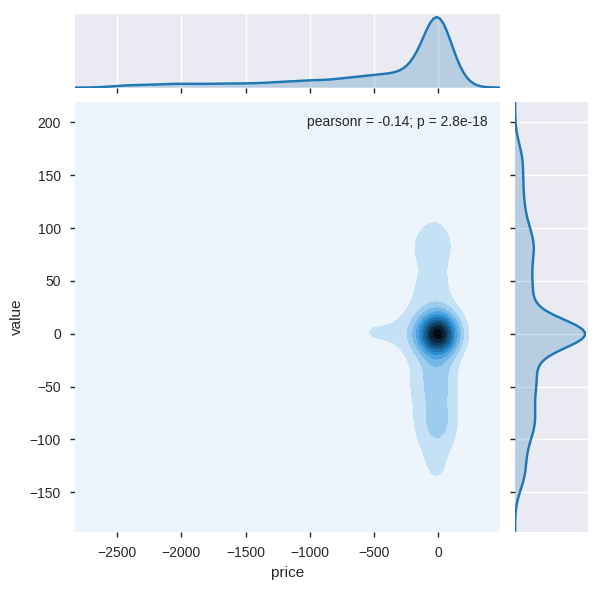

In [260]:
plt.figure(figsize=(10,10))
ax = sns.jointplot(x='price', y ='value',data=filt_data, kind='kde')

In [268]:
def quantile_filter(data, q=0.01):
    mask = np.ones_like(data.iloc[:,0], dtype=bool)
    for col in data.columns:
        mask&=  (data[col] < data[col].quantile(1-q)) & (data[col] > data[col].quantile(q))
    return data[mask]

In [261]:
deltas={}
for set_id,set_group in tqdm_notebook(train_df[['id','date1','value','flat_cnt']].groupby('id')):
    set_group = set_group.drop('id', axis=1).set_index('date1')
    delta = {date : set_group.loc[date] - set_group.loc[date+relativedelta(months=1)]
            for date in set_group.index if date+relativedelta(months=1) in set_group.index}
    deltas[set_id] = pd.DataFrame(delta).T
data = pd.concat([deltas[i][['value','flat_cnt']] for i in deltas.keys() if 'value' in deltas[i]])

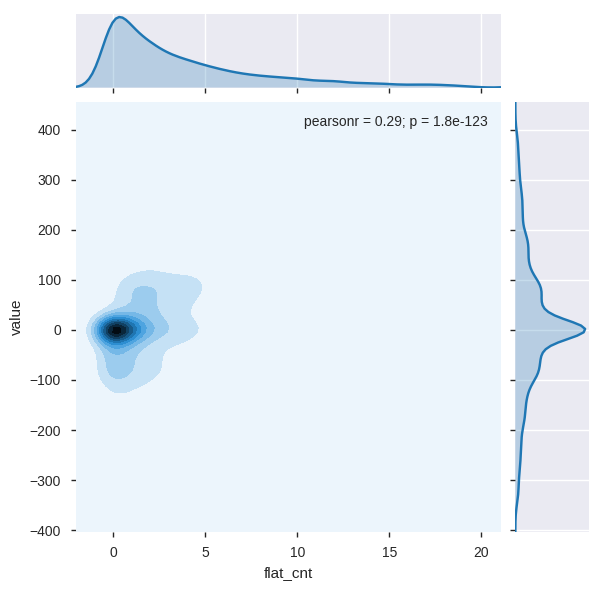

In [271]:
plt.figure(figsize=(10,10))
ax = sns.jointplot(x='flat_cnt', y ='value',data=quantile_filter(data, 0.05), kind='kde')

In [272]:
deltas={}
for set_id,set_group in tqdm_notebook(train_df[['id','date1','value','square']].groupby('id')):
    set_group = set_group.drop('id', axis=1).set_index('date1')
    delta = {date : set_group.loc[date] - set_group.loc[date+relativedelta(months=1)]
            for date in set_group.index if date+relativedelta(months=1) in set_group.index}
    deltas[set_id] = pd.DataFrame(delta).T
data = pd.concat([deltas[i][['value','square']] for i in deltas.keys() if 'value' in deltas[i]])

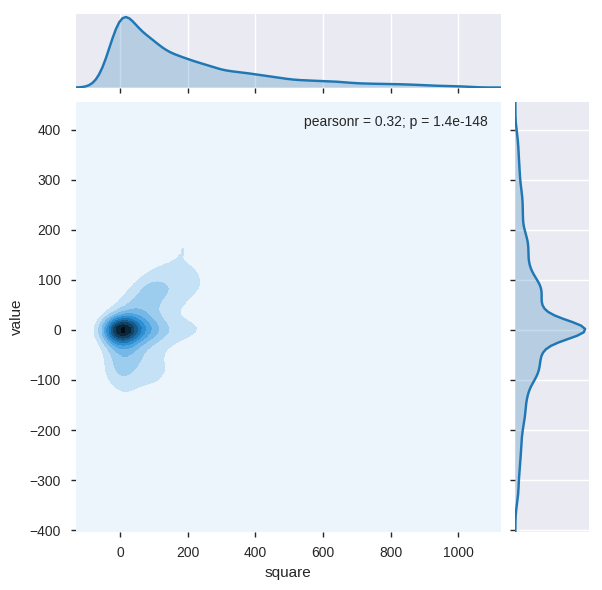

In [273]:
plt.figure(figsize=(10,10))
ax = sns.jointplot(x='square', y ='value',data=quantile_filter(data, 0.05), kind='kde')

In [288]:
iplot([py.Histogram2d(x=train_df.date1, y=train_df.flat_cnt, nbinsy=train_df.date1.nunique())])

In [298]:
train_df = train_df.merge(train_df.groupby('id')['month_cnt'].min().rename('month_sale_start').reset_index(),
               on='id', how='left')

In [300]:
train_df['months_after_start'] = train_df['month_cnt']-train_df['sale_start']

In [329]:
iplot([py.Scatter(x=train_df.months_after_start, y=train_df.flat_cnt/train_df.flat_max, mode='markers')])

In [312]:
train_df = train_df.merge(train_df[train_df.months_after_start==0][['id','flat_cnt']].rename(columns={'flat_cnt':'flat_start'}),
               on='id', how='left')

iplot([py.Scatter(x=train_df.months_after_start, y=train_df.value/train_df.start_square, mode='markers')])

In [326]:
train_df = train_df.set_index('date1').sort_index()

In [328]:
train_df['flat_max'] = train_df.groupby('id')['flat_cnt'].cummax()

In [123]:
train_df['id'] = train_df.bulk_id.astype(str)+'\\'+train_df.spalen.astype(str)
test_df['id'] = test_df.bulk_id.astype(str)+'\\'+test_df.spalen.astype(str)
df = pd.concat([train_df, test_df])[train_df.columns]

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




In [313]:
train_df['id'] = train_df.bulk_id.astype(str)+'\\'+train_df.spalen.astype(str)


In [188]:
flat_df['id'] = flat_df.id_bulk.astype(str)+'\\'+flat_df.spalen.astype(int).astype(str)
meters = flat_df.groupby(['id', 'plan_size'])['square'].median().reset_index()
meters = meters.pivot(index='id',columns='plan_size')

In [190]:
meters = meters.reset_index()

In [191]:

meters.columns = ['_'.join(filter(lambda s: len(s) >0, col)) for col in meters.columns.tolist()]

In [192]:
meters

,id,square_-1,square_L,square_M,square_S
0,01778D74-9326-E711-96FE-001EC9D5643C\0,NaN,NaN,NaN,22.70
1,01778D74-9326-E711-96FE-001EC9D5643C\1,NaN,46.800,NaN,NaN
2,01778D74-9326-E711-96FE-001EC9D5643C\2,NaN,69.400,NaN,46.30
3,01778D74-9326-E711-96FE-001EC9D5643C\3,NaN,93.600,NaN,NaN
4,01FE2A0C-2215-E711-96FE-001EC9D5643C\1,NaN,43.600,NaN,NaN
5,01FE2A0C-2215-E711-96FE-001EC9D5643C\2,NaN,65.100,NaN,53.45
6,01FE2A0C-2215-E711-96FE-001EC9D5643C\3,NaN,89.800,81.70,NaN
7,030E1C6F-6CAF-E711-8547-00505688958B\1,NaN,43.600,38.50,NaN
8,030E1C6F-6CAF-E711-8547-00505688958B\2,NaN,66.700,NaN,NaN
9,030E1C6F-6CAF-E711-8547-00505688958B\3,NaN,92.950,72.20,NaN


In [124]:
plan_df = df.groupby('id')[['plan_s', 'plan_m', 'plan_l']].sum()

In [125]:
plan_df = plan_df.reset_index().merge(meters, on='id', how='left')

In [126]:
for sqr, plan in zip(['square_S','square_M','square_L'],['plan_s','plan_m','plan_l']):
    plan_df['missed_'+sqr] = plan_df[sqr][plan_df[plan]>0].isna()

In [128]:
plan_df[['missed_square_S', 'missed_square_M', 'missed_square_L']].fillna(False).mean()

missed_square_S    0.0
missed_square_M    0.0
missed_square_L    0.0
dtype: float64

In [132]:
set(df.id) - set(meters.id)

set()

In [193]:
df= train_df.merge(meters, on='id', how='left')

In [194]:
df[['plan_s_sold','plan_m_sold','plan_l_sold']] = df.sort_values('date1').groupby('id')[['plan_s','plan_m','plan_l']].diff()

In [195]:
df['my_value']= -((df['plan_s_sold']*df['square_S']).fillna(0)+\
(df['plan_m_sold']*df['square_M']).fillna(0)+\
(df['plan_l_sold']*df['square_L']).fillna(0))

In [196]:
df['value_error'] = df['value'][df['my_value']!=0]-  df['my_value'][df['my_value']!=0]

In [197]:
df['value_error'].dropna().iplot(kind = 'hist')

In [163]:
print('hey!')

hey!


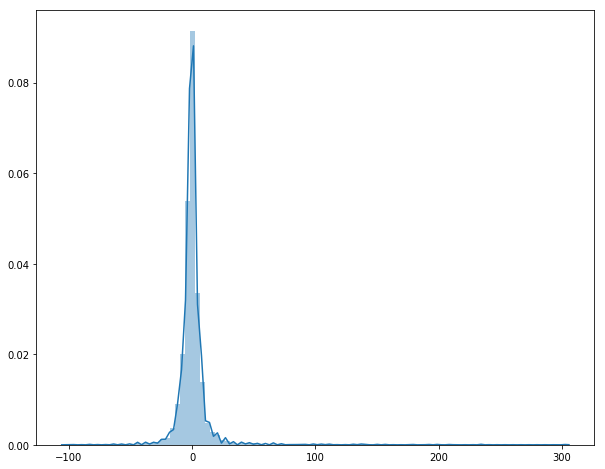

In [198]:
plt.figure(figsize=(10,8))
sns.distplot((df['value_error']/df['square_S']).dropna(), bins=100)

In [4]:
train_df['id'] = train_df.bulk_id.astype(str)+'\\'+train_df.spalen.astype(str)
test_df['id'] = test_df.bulk_id.astype(str)+'\\'+test_df.spalen.astype(str)
flat_df['id'] = flat_df.id_bulk.astype(str)+'\\'+flat_df.spalen.astype(int).astype(str)

train_df['date1'] = pd.to_datetime(train_df['date1'])
test_df['date1'] = pd.to_datetime(test_df['date1'])
flat_df['sale'] = pd.to_datetime(flat_df['sale'])

In [5]:
# min_date = flat_df['sale'].min()
min_date = datetime.datetime(year=2011, month=1, day=1)
# max_date = train_df['date1'].max()
max_date = datetime.datetime(year=2018, month=5, day=1)
dates = [min_date+relativedelta(months=m) 
         for m in itertools.takewhile(lambda m: min_date+relativedelta(months=m)<max_date+relativedelta(months=1), range(200))]
dates+=[flat_df['sale'].max()]

In [6]:
sales = dict()
for idx, set_df in tqdm_notebook(flat_df.groupby('id')):
    sales[idx] = {str(datetime.datetime(year=date.year, month=date.month, day=1)):{l:[] for l in ['-1','s','m','l'] }
                  for date in dates}
    for _, row in set_df.iterrows():
        sqr, sale_date, plan = row['square'], row['sale'], row['plan_size']
        key = str(datetime.datetime(year=sale_date.year, month=sale_date.month, day=1))
        if key in sales[idx]:
            sales[idx][key][plan.lower()].append(sqr)

In [7]:
data = []
for idx in sales:
    for date in sales[idx]:
        sale_date = pd.to_datetime(date)
        data_row = [sales[idx][date][l] for l in ['-1','s','m','l']]
        data.append([idx,sale_date]+data_row)
sales_df = pd.DataFrame(data, columns = ['id','date1','plan_-1_sales','plan_s_sales','plan_m_sales','plan_l_sales'])

In [8]:
sales_df

,id,date1,plan_-1_sales,plan_s_sales,plan_m_sales,plan_l_sales
0,01778D74-9326-E711-96FE-001EC9D5643C\0,2011-01-01,[],[],[],[]
1,01778D74-9326-E711-96FE-001EC9D5643C\0,2011-02-01,[],[],[],[]
2,01778D74-9326-E711-96FE-001EC9D5643C\0,2011-03-01,[],[],[],[]
3,01778D74-9326-E711-96FE-001EC9D5643C\0,2011-04-01,[],[],[],[]
4,01778D74-9326-E711-96FE-001EC9D5643C\0,2011-05-01,[],[],[],[]
5,01778D74-9326-E711-96FE-001EC9D5643C\0,2011-06-01,[],[],[],[]
6,01778D74-9326-E711-96FE-001EC9D5643C\0,2011-07-01,[],[],[],[]
7,01778D74-9326-E711-96FE-001EC9D5643C\0,2011-08-01,[],[],[],[]
8,01778D74-9326-E711-96FE-001EC9D5643C\0,2011-09-01,[],[],[],[]
9,01778D74-9326-E711-96FE-001EC9D5643C\0,2011-10-01,[],[],[],[]


In [97]:
cols = []
for col in ['plan_-1_sales','plan_s_sales','plan_m_sales','plan_l_sales']:
    cols.append('_'.join(col.split('_')[:-1]+['value']))
    sales_df[cols[-1]] = sales_df[col].apply(np.sum)
    cols.append('_'.join(col.split('_')[:-1]+['sold']))
    sales_df[cols[-1]] = sales_df[col].apply(len)
    
    mean_square = sales_df.groupby('id')[col].apply(lambda x: np.hstack(x.values).mean())
    sales_df = sales_df.merge(mean_square.rename('_'.join(col.split('_')[:-1]+['mean_square'])).reset_index(),
                              on='id', how='left')

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning:

Mean of empty slice.

/home/ubuntu/.local/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning:

invalid value encountered in double_scalars



In [98]:
grsales = sales_df.groupby('id')

In [99]:
rem_sales=[]
for _, set_df in grsales:
    rem_df = (set_df[cols].sum() - set_df.sort_values('date1')[cols].cumsum()).rename(mapper=lambda s: s+'_remainder',axis=1)
    rem_sales.append(pd.concat([set_df[['id','date1']+cols], rem_df],axis=1))

In [100]:
rem_sales = pd.concat(rem_sales)

In [101]:
rem_sales['flatdf_mean_sq'] = rem_sales[['plan_-1_value_remainder','plan_s_value_remainder',
                         'plan_m_value_remainder','plan_l_value_remainder']].sum(axis=1)/\
rem_sales[['plan_-1_sold_remainder','plan_s_sold_remainder',
                         'plan_m_sold_remainder','plan_l_sold_remainder']].sum(axis=1)

In [102]:
residue = train_df.merge(rem_sales, on=['id','date1'], how='left')[['mean_sq','flatdf_mean_sq']]

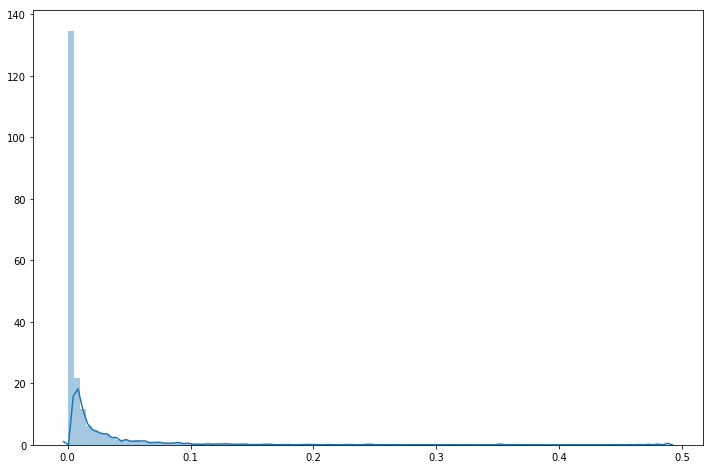

In [72]:
plt.figure(figsize=(12,8))
sns.distplot((np.abs(residue['mean_sq'] -residue['flatdf_mean_sq'])/residue['mean_sq']).dropna(), bins=100)

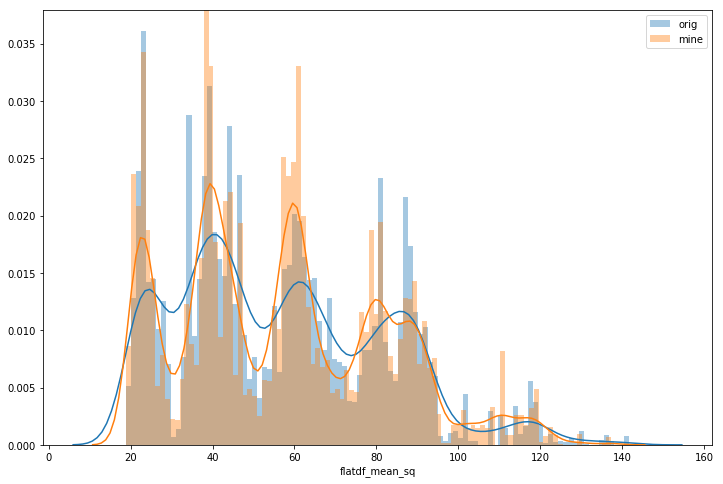

In [80]:
plt.figure(figsize=(12,8))
sns.distplot(residue['mean_sq'],label='orig', bins=100)
sns.distplot(rem_sales['flatdf_mean_sq'].dropna(), label='mine', bins=100)
plt.legend()

In [96]:
train_df.merge(rem_sales, on=['id','date1'], how='left')[['plan_l','plan_l_sold_remainder']]

,plan_l,plan_l_sold_remainder
0,0,0.0
1,83,89.0
2,0,0.0
3,72,68.0
4,0,0.0
5,79,78.0
6,0,0.0
7,67,67.0
8,0,0.0
9,68,75.0


In [90]:
tmp = train_df.merge(train_df.groupby('id')['mean_sq'].max().rename('max_mean_sq').reset_index(),on='id')

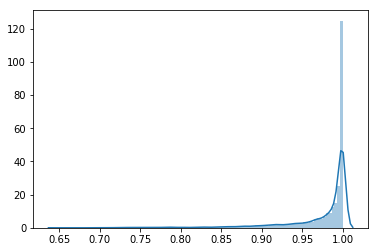

In [93]:
sns.distplot( tmp['mean_sq']/tmp['max_mean_sq'], bins =100  )

In [95]:
train_df.sort_values(['id','date1'])

,id,bulk_id,spalen,date1,start_square,value,price,mean_sq,mean_fl,plan_s,plan_m,plan_l,vid_0,vid_1,vid_2,month,month_cnt,Класс объекта,Количество помещений,Огорожена территория,Площадь земельного участка,Входные группы,Детский сад,Школа,Поликлиника,ФОК,Спортивная площадка,Автомойка,Кладовые,Колясочные,Кондиционирование,Вентлияция,Лифт,Система мусоротведения,Видеонаблюдение,Подземная парковка,Двор без машин,Машиномест,Площадь пром. зоны в радиусе 500 м,Площадь зеленой зоны в радиусе 500 м,До Кремля,До ТТК(км),До Садового(км),До большой дороги на машине(км),До удобной авторазвязки на машине(км),До метро пешком(км),До промки(км),До парка(км),До парка пешком(км),Станций метро от кольца,Площадь двора,Курс,Cтавка по ипотеке,Вклады до 1 года,Вклады от 1 года до 3 лет,Вклады свыше 3 лет
3676,01778D74-9326-E711-96FE-001EC9D5643C\0,01778D74-9326-E711-96FE-001EC9D5643C,0,2017-06-01,501.80,184.20,151436.363636,22.81,13,22,0,0,0,0,22,6,30,комфорт,912,нет,70.0,да,700,1650,0,0,да,нет,да,да,3,0,1,контейнеры,1,нет,да,4770,0,80280,16.0,11.0,14.0,0.14,1.9,0.55,0.44,0.35,1.10,7,7567,57.893176,11.26,5.73,6.42,7.97
3709,01778D74-9326-E711-96FE-001EC9D5643C\0,01778D74-9326-E711-96FE-001EC9D5643C,0,2017-07-01,317.60,136.10,154528.571429,22.69,16,14,0,0,0,0,14,7,31,комфорт,912,нет,70.0,да,700,1650,0,0,да,нет,да,да,3,0,1,контейнеры,1,нет,да,4770,0,80280,16.0,11.0,14.0,0.14,1.9,0.55,0.44,0.35,1.10,7,7567,59.692676,11.00,6.17,6.62,6.04
3740,01778D74-9326-E711-96FE-001EC9D5643C\0,01778D74-9326-E711-96FE-001EC9D5643C,0,2017-08-01,181.50,45.40,159650.000000,22.69,16,8,0,0,0,0,8,8,32,комфорт,912,нет,70.0,да,700,1650,0,0,да,нет,да,да,3,0,1,контейнеры,1,нет,да,4770,0,80280,16.0,11.0,14.0,0.14,1.9,0.55,0.44,0.35,1.10,7,7567,59.612726,10.87,6.19,6.70,7.76
3772,01778D74-9326-E711-96FE-001EC9D5643C\0,01778D74-9326-E711-96FE-001EC9D5643C,0,2017-09-01,136.10,22.70,165200.000000,22.68,16,6,0,0,0,0,6,9,33,комфорт,912,нет,70.0,да,700,1650,0,0,да,нет,да,да,3,0,1,контейнеры,1,нет,да,4770,0,80280,16.0,11.0,14.0,0.14,1.9,0.55,0.44,0.35,1.10,7,7567,57.744691,10.51,5.30,6.65,6.80
3802,01778D74-9326-E711-96FE-001EC9D5643C\0,01778D74-9326-E711-96FE-001EC9D5643C,0,2017-10-01,113.40,22.70,168800.000000,22.68,15,5,0,0,0,0,5,10,34,комфорт,912,нет,70.0,да,700,1650,0,0,да,нет,да,да,3,0,1,контейнеры,1,нет,да,4770,0,80280,16.0,11.0,14.0,0.14,1.9,0.55,0.44,0.35,1.10,7,7567,57.698052,10.04,5.74,5.94,6.03
3832,01778D74-9326-E711-96FE-001EC9D5643C\0,01778D74-9326-E711-96FE-001EC9D5643C,0,2017-11-01,90.70,45.40,170575.000000,22.68,14,4,0,0,0,0,4,11,35,комфорт,912,нет,70.0,да,700,1650,0,0,да,нет,да,да,3,0,1,контейнеры,1,нет,да,4770,0,80280,16.0,11.0,14.0,0.14,1.9,0.55,0.44,0.35,1.10,7,7567,58.926552,9.87,5.17,7.07,6.20
3861,01778D74-9326-E711-96FE-001EC9D5643C\0,01778D74-9326-E711-96FE-001EC9D5643C,0,2017-12-01,45.30,22.60,170650.000000,22.65,13,2,0,0,0,0,2,12,36,комфорт,912,нет,70.0,да,700,1650,0,0,да,нет,да,да,3,0,1,контейнеры,1,нет,да,4770,0,80280,16.0,11.0,14.0,0.14,1.9,0.55,0.44,0.35,1.10,7,7567,58.573855,9.73,5.31,6.28,5.89
3892,01778D74-9326-E711-96FE-001EC9D5643C\0,01778D74-9326-E711-96FE-001EC9D5643C,0,2018-01-01,22.70,0.00,177300.000000,22.70,23,1,0,0,0,0,1,1,37,комфорт,912,нет,70.0,да,700,1650,0,0,да,нет,да,да,3,0,1,контейнеры,1,нет,да,4770,0,80280,16.0,11.0,14.0,0.14,1.9,0.55,0.44,0.35,1.10,7,7567,56.498100,9.74,5.62,6.64,6.05
3673,01778D74-9326-E711-96FE-001EC9D5643C\1,01778D74-9326-E711-96FE-001EC9D5643C,1,2017-06-01,2200.90,140.10,118138.297872,46.83,13,0,0,47,47,0,0,6,30,комфорт,912,нет,70.0,да,700,1650,0,0,да,нет,да,да,3,0,1,контейнеры,1,нет,да,4770,0,80280,16.0,11.0,14.0,0.14,1.9,0.55,0.44,0.35,1.10,7,7567,57.893176,11.26,5.73,6.42,7.97
3706,01778D74-9326-E711-96FE-001EC9D5643C\1,01778D74-9326-E711-96FE-001EC9D5643C,1,2017-07-01,2060.80,141.10,118402.272727,46.84,13,0,0,44,44,0,0,7,31,комфорт,912,нет,70.0,да,700,1650,0,0,да,нет,да,да,3,0,1,контейнеры,1,нет,да,4770,0,80280,16.0,11.0,14.0,0.14,1.9,0.55,0.44,0.35,1.10,7,7567,59.692676,11.00,6.17,6.62,6.04


In [103]:
who

cf	 col	 cols	 data	 data_row	 date	 dates	 datetime	 flat_df	 
gc	 grsales	 idx	 init_notebook_mode	 iplot	 itertools	 key	 max_date	 mean_square	 
min_date	 np	 os	 osp	 pandas_profiling	 pd	 plan	 plot	 plt	 
price_df	 py	 relativedelta	 rem_df	 rem_sales	 residue	 row	 sale_date	 sales	 
sales_df	 set_df	 sns	 sqr	 status_df	 test_df	 tmp	 tqdm_notebook	 train_df	 



In [106]:
train_df = pd.read_csv('train.csv', encoding='cp1251')
test_df = pd.read_csv('test.csv')

In [107]:
train_df['id'] = train_df.bulk_id.astype(str)+'\\'+train_df.spalen.astype(str)
test_df['id'] = test_df.bulk_id.astype(str)+'\\'+test_df.spalen.astype(str)

In [108]:
df = pd.concat([train_df, test_df])[train_df.columns]

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




In [109]:
df = df.merge(df.groupby('id')['month_cnt'].min().rename('month_sale_start').reset_index(),
               on='id', how='left')
df['months_after_start'] = df['month_cnt'] - df['month_sale_start']

In [110]:
df['date1'] = pd.to_datetime(df.date1)

In [125]:
iplot([py.Histogram(x = df[df.date1< TEST_START_DATE]['months_after_start'] ,histnorm='probability', name='train'),
      py.Histogram(x = df[df.date1 >= TEST_START_DATE]['months_after_start'], histnorm='probability', name='test')])

In [131]:
valid_idx = (df.date1 >= (TEST_START_DATE-relativedelta(months=3))) & (df.date1< TEST_START_DATE)

In [132]:
iplot([py.Histogram(x = df[valid_idx]['months_after_start'] ,histnorm='probability', name='valid'),
      py.Histogram(x = df[df.date1 >= TEST_START_DATE]['months_after_start'], histnorm='probability', name='test')])

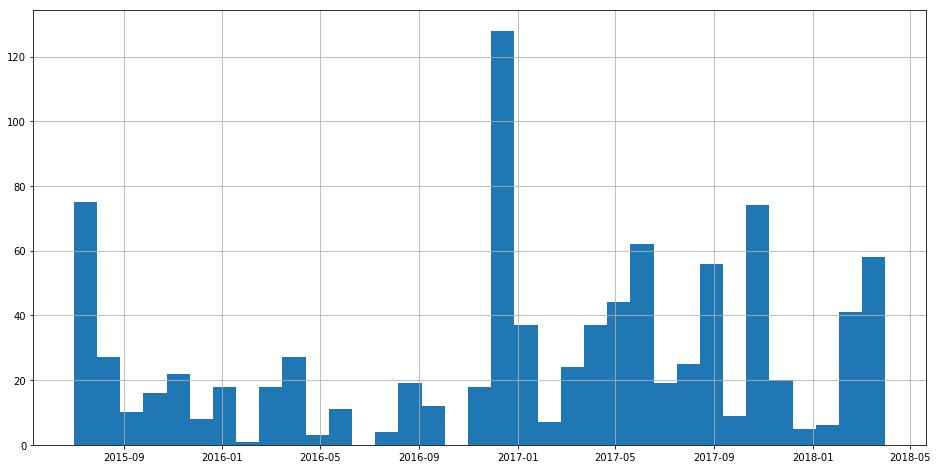

In [143]:
plt.figure(figsize=(16,8))
df[df.months_after_start==0].date1.hist(bins=df.date1.nunique()+1)

In [152]:
gk_df = flat_df[['id_bulk','id_gk']].drop_duplicates()

In [156]:
df= df.merge(gk_df, left_on=['bulk_id'], right_on=['id_bulk'])

In [158]:
gk_date = dict()
for date in df.date1.unique():
    gk_date[date] = set(df[df.date1==date]['id_gk'])

In [171]:
gk_cum = set()
gk_plot = []
for date in sorted(gk_date.keys()):
    gk_plot.append(len(gk_date[date] -gk_cum))
    gk_cum = gk_cum | gk_date[date]

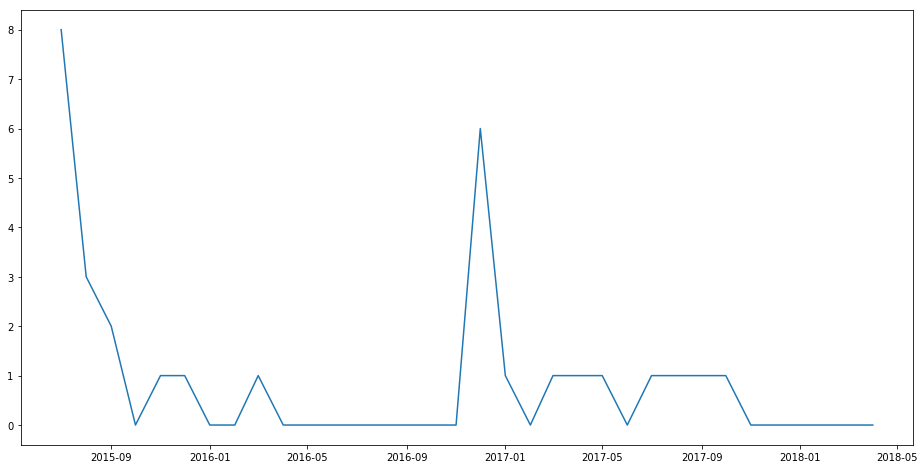

In [172]:
plt.figure(figsize=(16,8))
plt.plot(sorted(gk_date.keys()),gk_plot)

In [173]:
gk_plot

[8,
 3,
 2,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 6,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0]